# ELE AI算法大赛“赛道三：智算商效—智能化市场营销解决方案探寻”
**队伍：神券何时膨胀**，**学校：重庆邮电大学**，**队员：魏柄坤，张峻豪，朱恒**
## 数据探索性分析(Exploratory Data Analysis)

## 读取数据

In [3]:
import pandas as pd
import numpy as np
train_df = pd.read_csv("../dataset/train.txt", sep='\t')
test_df = pd.read_csv("../dataset/A.txt", sep='\t')
train_df['istest'] = 0
test_df['istest'] = 1
df = pd.concat([train_df, test_df], axis=0)

# # 保存为CSV文件
# train_df.to_csv("train_df.csv", index=False)
# test_df.to_csv("test_df.csv", index=False)

# # 保存为Excel文件
# train_df.to_excel("train_df.xlsx", index=False)
# test_df.to_excel("test_df.xlsx", index=False)

C:\Users\18442\AppData\Local\Temp\ipykernel_8556\174670158.py:3: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv("../dataset/train.txt", sep='\t')


In [4]:
train_df.head()

,id,update_time,publish_time,site_id,title,content,uid,gender,age,city,fans_cnt,topics,video_cnt,coin_cnt,post_type,cover_ocr_content,video_content,interaction_cnt,istest
0,503864075537828120240527,20240527,20240527,1,NaN,六一的风，已经吹动了多少个宝宝？5月27日-6月7日上饿了么搜「折个儿童节」，童年快乐不只6...,b2c2096f1d4ce21dec32d21f6894d11f,女,60岁以上,NaN,10000,"""[""""饿了么折个儿童节""""]""",NaN,10000,常规图文,①C·饿了么\n节\n斤个心\n上个我了么放心点\ncococean\n\n童年快乐不只6....,NaN,0,0
1,503859033984486120240527,20240527,20240527,1,NaN,童年的纸飞机，现在终于飞回我手里！\n亲爱的大朋友小朋友们，\n5月27日-6月7日上饿了么...,a6332fd2b8428dbb54cc5b0836d5fd14,女,26-30岁,NaN,12000,"""[""""饿了么折个儿童节""""]""",NaN,4000,常规图文,①C·饿了么\n眉州东坡\n\n斤个儿\n上个我了么放心点\n眉州东坡\n\n童年快乐准时达...,NaN,0,0
2,503868055486634820240527,20240527,20240527,1,NaN,童年的纸飞机，现在终于飞回我手里！[纸飞机][纸飞机]\n亲爱的大朋友小朋友们，5月27日-...,370b636aa0656c6ebc1ba3a14b86a8e4,男,60岁以上,NaN,9000,"""[""""饿了么折个儿童节"""",""""花小新疆炒米粉""""]""",NaN,7000,常规图文,①HUAXIAOXIAO\n·饿了么\n花\n\n\n来一碗燃起来\n节\n斤个儿\n上个我...,NaN,0,0
3,503858709319246220240527,20240527,20240527,1,NaN,#卡卡深夜落地贵阳#童年的纸飞机终于飞回我手里,252618759dd4f949000c1effd20c7dc0,女,31-40岁,贵阳,0,"""[""""卡卡深夜落地贵阳""""]""",NaN,NaN,常规图文,NaN,NaN,0,0
4,503894276702418820240531,20240531,20240528,1,NaN,童年的纸飞机，现在终于飞回我手里！\n亲爱的大朋友、小朋友们\n5月27日-6月7日上@饿了...,52852e67be1ebfbf4c4051a55929fb25,女,60岁以上,NaN,230000,"""[""""饿了么折个儿童节""""]""",NaN,1110000,常规图文,①C饿了么×棒!约翰\n可和\n节\n个\n上个饿了么放心点\n棒约翰\n童年快乐准时达\n...,NaN,5,0


In [2]:
train_df[['id', 'interaction_cnt']]

,id,interaction_cnt
0,503864075537828120240527,0
1,503859033984486120240527,0
2,503868055486634820240527,0
3,503858709319246220240527,0
4,503894276702418820240531,5
...,...,...
585271,15ddac541d8137c3f2776f614524cd7320241225,0
585272,4c0cb0d355f43bb85214bb4d4bd5db1e20241225,0
585273,9bb9ac310b1fb9e7089159cf85b840b520241225,0
585274,060cf72f5a34966d37439359815fa14820241225,5


In [26]:
print("=== Train DataFrame 缺失值情况 ===")
print(train_df.isnull().sum())

=== Train DataFrame 缺失值情况 ===
id                        0
update_time               0
publish_time              0
site_id                   0
title                568731
content                 106
uid                       0
gender               161057
age                       0
city                 259428
fans_cnt             104545
topics                19724
video_cnt            297365
coin_cnt             263251
post_type             21782
cover_ocr_content    208184
video_content        439063
interaction_cnt           0
istest                    0
id_len                    0
dtype: int64


In [27]:
# 查看 test_df 的缺失值情况
print("\n=== Test DataFrame 缺失值情况 ===")
print(test_df.isnull().sum())


=== Test DataFrame 缺失值情况 ===
id                       0
update_time              0
publish_time             0
site_id                  0
title                73018
content                  0
uid                      0
gender               32318
age                      0
city                 31587
fans_cnt             26554
topics                  88
video_cnt            34466
coin_cnt             29661
post_type              189
cover_ocr_content    20710
video_content        72973
istest                   0
id_len                   0
dtype: int64


缺失值影响递减
- fans_cnt, video_cnt, coin_cnt
- title, topics, cover_ocr_content, video_content
- gender, city

## ID 字段分析
第一个字段就是id，不知道小伙伴们是不是通常直接忽略掉这个字段，认为这不过是一段匿名编码，事实却并非如此
id 长度并非是随机的，仔细分析发现也有一定规律可循
- 503864075537828120240527  ->5038640755378281|20240527  
- 060cf72f5a34966d37439359815fa14820241225 ->  060cf72f5a34966d37439359815fa148|20241225  

In [6]:
train_df['id_len'] = train_df['id'].apply(lambda x: len(x))
test_df['id_len'] = test_df['id'].apply(lambda x: len(x))

In [7]:
train_df['id_len'].value_counts()

id_len
40    384165
24    179329
32     21782
Name: count, dtype: int64

In [8]:
test_df['id_len'].value_counts()

id_len
40    65153
24     7818
32      189
Name: count, dtype: int64

无论是训练集还是测试集，id 长度一共只有三种（40/32/24），这是否代表了某种数据收集的渠道（方法）？下面我们来分析一下不同id长度互动量的分布情况

In [9]:
# 不同id长度的互动量统计信息
id_len_stats = train_df.groupby('id_len')['interaction_cnt'].describe()
display(id_len_stats)

,count,mean,std,min,25%,50%,75%,max
id_len,,,,,,,,
24,179329.0,61.271908,941.245510,0.0,0.0,0.0,0.0,125700.0
32,21782.0,147.028510,1467.704091,0.0,0.0,5.0,5.0,76300.0
40,384165.0,222.473859,8210.339100,0.0,0.0,5.0,5.0,1610200.0


那么 id_len 与 post_type 和 site_id 有关系吗？

In [10]:
# 分析每个id len下post_type的分布
# 计算每个id_len下各post_type的数量
site_post_counts = test_df.groupby(['id_len', 'post_type']).size().reset_index(name='count')
pivot_table = site_post_counts.pivot_table(index='id_len', columns='post_type', values='count', fill_value=0)
pivot_table['total'] = pivot_table.sum(axis=1)
# 计算百分比分布
percent_table = pivot_table.copy()
for col in pivot_table.columns:
    if col != 'total':
        percent_table[f'{col}_pct'] = (pivot_table[col] / pivot_table['total'] * 100).round(2)
print("Test Data Post type counts by id len:")
pivot_table

Test Data Post type counts by id len:


post_type,常规图文,常规视频,广告视频,total
id_len,,,,
24,7816.0,2.0,0.0,7818.0
40,3967.0,61169.0,17.0,65153.0


In [11]:
# 分析每个id len 下site_id的分布
site_post_counts = test_df.groupby(['id_len', 'site_id']).size().reset_index(name='count')
pivot_table = site_post_counts.pivot_table(index='id_len', columns='site_id', values='count', fill_value=0)
pivot_table['total'] = pivot_table.sum(axis=1)
percent_table = pivot_table.copy()
for col in pivot_table.columns:
    if col != 'total':
        percent_table[f'{col}_pct'] = (pivot_table[col] / pivot_table['total'] * 100).round(2)
print("Test Data site_id counts by id len:")
pivot_table

Test Data site_id counts by id len:


site_id,1,2,3,4,total
id_len,,,,,
24,7818.0,0.0,0.0,0.0,7818.0
32,0.0,0.0,189.0,0.0,189.0
40,0.0,200.0,0.0,64953.0,65153.0


很明显，id_len 与 site_id（素材来源渠道）有着高度相关性

In [ ]:
display(train_df[['id','site_id', 'fans_cnt','coin_cnt', 'interaction_cnt']].head(10))
display(train_df[['id','site_id', 'fans_cnt','coin_cnt', 'interaction_cnt']].tail(10))

,id,site_id,fans_cnt,coin_cnt,interaction_cnt
0,503864075537828120240527,1,10000,10000,0
1,503859033984486120240527,1,12000,4000,0
2,503868055486634820240527,1,9000,7000,0
3,503858709319246220240527,1,0,NaN,0
4,503894276702418820240531,1,230000,1110000,5
5,5e1fa03170bcf3df1a839153e5acd02820240612,2,900,100,10
6,61bb99e0dac868dc97edf979ac89266a20240528,2,900,100,0
7,171463e6f93ec905fb3debc553e1b8c220240528,2,0,6000,0
8,fb48ad352d3befb158fbb82f92eb1ca420240604,2,小于100,200,10
9,fb1d2c0416ca0a26ce38b89ec36cf0e320240528,2,0,1000,0


,id,site_id,fans_cnt,coin_cnt,interaction_cnt
585266,ef37ef5dc70e9b54647e659fc66a22b920241228,4,0,4000,10
585267,511542658963944520241225,1,小于100,小于100,0
585268,f4c60838d34d029ecb8e1959278b381120241225,4,0,1000,0
585269,9155d6cd766a3ce310f9e849184767d420241225,4,0,1000,5
585270,8bc2f680ac81d5da7ebff4b462eade0120241225,4,NaN,NaN,0
585271,15ddac541d8137c3f2776f614524cd7320241225,4,NaN,NaN,0
585272,4c0cb0d355f43bb85214bb4d4bd5db1e20241225,4,NaN,NaN,0
585273,9bb9ac310b1fb9e7089159cf85b840b520241225,4,小于100,小于100,0
585274,060cf72f5a34966d37439359815fa14820241225,4,小于100,400,5
585275,5084af4ac713994892170d1bddfb547320241225,4,小于100,100,5



### 结论
- id 通常是由 标识符 + 时间戳构成，在b榜数据公布后，会发现去掉时间戳之后，有重复的标识符，相当于出现了数据泄露，是一个能hack的点
- id_len 与 site_id 有高度相关性，这为我们后续**分场景建模**提供了除 post_type/site_id 以外又一新的思路  

## 时间分布情况

In [12]:
df[['publish_time','update_time']]

,publish_time,update_time
0,20240527,20240527
1,20240527,20240527
2,20240527,20240527
3,20240527,20240527
4,20240528,20240531
...,...,...
73155,20241227,20241227
73156,20241225,20241225
73157,20241228,20241229
73158,20241231,20241231


In [13]:
print("train data :", train_df['publish_time'].min(), train_df['publish_time'].max())
print("test data :", test_df['publish_time'].min(), test_df['publish_time'].max())

train data : 20240527 20241225
test data : 20241225 20250107


赛方为了避免**时间穿越**情况发生，测试集（A/B榜）时间分布均在训练集之后

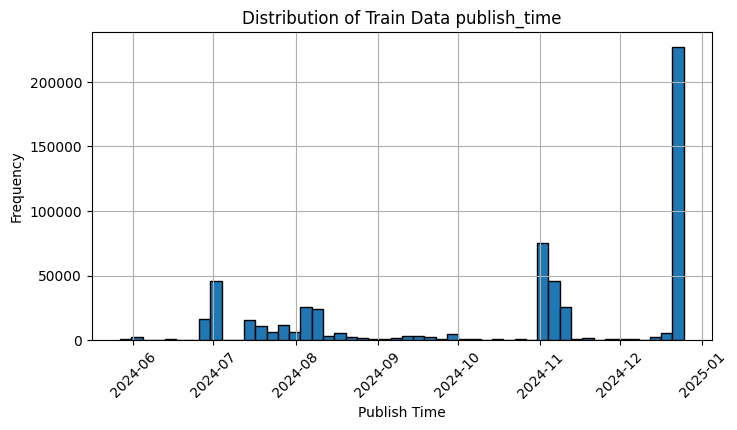

In [14]:
import matplotlib.pyplot as plt
train_df['publish_time'] = pd.to_datetime(train_df['publish_time'], format='%Y%m%d')
plt.figure(figsize=(8,4))
train_df['publish_time'].hist(bins=50, edgecolor='black')
plt.title('Distribution of Train Data publish_time')
plt.xlabel('Publish Time')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

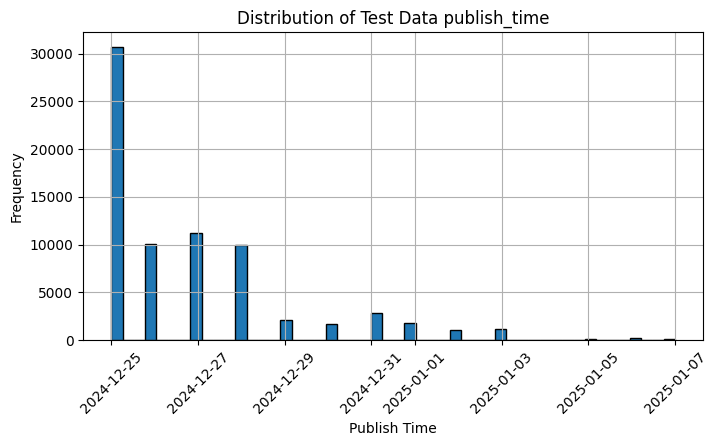

In [15]:
import matplotlib.pyplot as plt
test_df['publish_time'] = pd.to_datetime(test_df['publish_time'], format='%Y%m%d')
plt.figure(figsize=(8,4))
test_df['publish_time'].hist(bins=50, edgecolor='black')
plt.title('Distribution of Test Data publish_time')
plt.xlabel('Publish Time')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

### 结论
通过观察我们发现，其实大多数训练集数据在24年11月之后，而数据具有很强的时效性：  
- eg.  "六一儿童节" "秋天的第一杯奶茶" "春节"  
  
我们可以通过简单的按照时间筛数据 / 对样本按照时间衰减赋权来让模型更多的学习新样本

In [16]:
def data_cleaning(df, is_train=True):
    """数据清洗，包括重复值删除、缺失值处理、异常值检测等"""
    df = df.copy()
    
    # 删除重复行
    df = df.drop_duplicates()
    
    # 缺失值处理
    # # 对于数值型特征，填充为该列的中位数
    # for col in df.select_dtypes(include=[np.number]).columns:
    #     df[col] = df[col].fillna(df[col].median())
    
    # # 对于分类变量，填充为该列的众数
    # for col in df.select_dtypes(include=[object]).columns:
    #     df[col] = df[col].fillna(df[col].mode()[0])
    
    # 测试集中没有广告图文
    df['post_type'] = df['post_type'].fillna('未知')  # 或者选择一个合理的默认值
    df = df[df['post_type'] != '广告图文']
    
    # 异常值处理
    quantile_999 = df['interaction_cnt'].quantile(0.999)
    # df['interaction_cnt'] = np.where(df['interaction_cnt'] > quantile_999, quantile_999, df['interaction_cnt'])

    return df

def data_preprocessing(df, is_train=True):
    """基础数据预处理"""
    df = df.copy()
    
    df['missing_values_count'] = df.isnull().sum(axis=1)
    
    # 时间特征分解
    df['publish_time'] = pd.to_datetime(df['publish_time'], format='%Y%m%d')
    df['update_time'] = pd.to_datetime(df['update_time'], format='%Y%m%d')
    
    # 发布时间特征
    df['publish_month'] = df['publish_time'].dt.month
    df['publish_weekday'] = df['publish_time'].dt.weekday
    df['publish_day'] = df['publish_time'].dt.day
    
    # 更新时效性特征
    df['update_delay_days'] = (df['update_time'] - df['publish_time']).dt.days
    # df['update_delay_seconds'] = (df['update_time'] - df['publish_time']).dt.total_seconds() 
    
    # 数据转换
    df[['fans_cnt', 'coin_cnt']] = df[['fans_cnt', 'coin_cnt']].replace({'小于100': 50}).fillna(0).astype(int)
    
    # post_type映射
    type_mapping = {'常规视频': 0, '常规图文': 1, '广告视频': 2, '未知': 3}
    df['post_type'] = (
        df['post_type'].map(type_mapping)
        .astype('category')  # 显式声明为category类型
    )

    # 性别映射
    gender_mapping = {'男': 0, '女': 1, '未知': 2}
    df['gender'] = (
        df['gender'].map(gender_mapping)
        .astype('category')
    )

    # 城市映射（二值化：未知=0，其他=1）
    df['city'] = (
        df['city'].apply(lambda x: 0 if x == '未知' else 1)
        .astype('category')
    )

    # 年龄分段映射（有序分类）
    age_mapping = {
        '0-5岁': 0, '6-10岁': 1, '11-15岁': 2, '16-20岁': 3,
        '21-25岁': 4, '26-30岁': 5, '31-40岁': 6, 
        '41-50岁': 7, '51-60岁': 8, '60岁以上': 9
    }
    df['age'] = (
        df['age'].map(age_mapping)
        .astype('category')
    )
    
    # 目标列变换
    # log变换
    df['interaction_cnt'] = np.log1p(df['interaction_cnt'])
    
    # df = df.drop(['publish_time', 'update_time'], axis=1)
    return df

## 文本列分析

In [17]:
print('data preprocessing:\n')
df = data_cleaning(df)
df = data_preprocessing(df)

data preprocessing:



In [22]:
display(df[['id','site_id', 'fans_cnt','coin_cnt', 'interaction_cnt']].head(5))
display(df[['id','site_id', 'fans_cnt','coin_cnt', 'interaction_cnt']].tail(5))

,id,site_id,fans_cnt,coin_cnt,interaction_cnt
0,503864075537828120240527,1,10000,10000,0.000000
1,503859033984486120240527,1,12000,4000,0.000000
2,503868055486634820240527,1,9000,7000,0.000000
3,503858709319246220240527,1,0,0,0.000000
4,503894276702418820240531,1,230000,1110000,1.791759


,id,site_id,fans_cnt,coin_cnt,interaction_cnt
73155,2e58bb7dffad448c997a92e3a5900c1220241227,4,0,8000,NaN
73156,0c607642feb6f4f090a8a0fc89ea9bd120241225,4,0,0,NaN
73157,421cdc1f3d53bfe7cc376485e65767bb20241229,4,0,0,NaN
73158,511761487809827320241231,1,50,50,NaN
73159,b594cbe43c22154fa1467f966577e5b620241225,4,0,0,NaN


In [20]:
df['content_len'] = df['content'].fillna('').apply(len)  # 计算 'content' 列的每一行长度，先填充 NaN 为 ''
df['topics_len'] = df['topics'].fillna('').apply(len)    # 计算 'topics' 列的每一行长度，先填充 NaN 为 ''
df['title_len'] = df['title'].fillna('').apply(len)      # 计算 'title' 列的每一行长度，先填充 NaN 为 ''
df['cover_ocr_content_len'] = df['cover_ocr_content'].fillna('').apply(len)  # 计算 'cover_ocr_content' 列的每一行长度，先填充 NaN 为 ''
df['video_content_len'] = df['video_content'].fillna('').apply(len)  # 计算 'video_content' 列的每一行长度，先填充 NaN 为 ''

In [21]:
df[['content_len','topics_len','title_len','cover_ocr_content_len','video_content_len','interaction_cnt']].head(10)

,content_len,topics_len,title_len,cover_ocr_content_len,video_content_len,interaction_cnt
0,97,16,0,105,0,0.000000
1,164,16,0,122,0,0.000000
2,148,28,0,156,0,0.000000
3,23,16,0,0,0,0.000000
4,136,16,0,89,0,1.791759
5,58,52,0,77,257,2.397895
6,61,55,0,0,0,0.000000
7,71,58,0,28,379,0.000000
8,53,43,0,150,461,2.397895
9,39,41,0,102,272,0.000000


In [ ]:
# 查看各文本列的长度统计情况
df[['content_len','topics_len','title_len','cover_ocr_content_len','video_content_len','interaction_cnt']].describe().T

,count,mean,std,min,25%,50%,75%,max
content_len,657231.0,59.270562,300.846651,0.0,16.0,28.0,54.000000,17121.00000
topics_len,657231.0,48.724550,305.567809,0.0,18.0,23.0,42.000000,5238.00000
title_len,657231.0,0.285326,1.991640,0.0,0.0,0.0,0.000000,142.00000
cover_ocr_content_len,657231.0,58.625812,352.580448,0.0,0.0,16.0,44.000000,37492.00000
video_content_len,657231.0,18.737789,83.324786,0.0,0.0,0.0,0.000000,8945.00000
interaction_cnt,584071.0,1.006731,1.399009,0.0,0.0,0.0,1.791759,14.29187


In [28]:
print("train data:", train_df['gender'].value_counts())
print("test data:", test_df['gender'].value_counts())

train data: gender
女     237884
男     165441
未知     20894
Name: count, dtype: int64
test data: gender
女     23751
男     14962
未知     2129
Name: count, dtype: int64


In [ ]:
train_df['city'].value_counts()

未知          110557
美国            4539
北京 海淀区        3880
广州            3520
重庆            3226
             ...  
穆拉库              1
静海县              1
比萨               1
嘉义               1
中国台湾 云林县         1
Name: city, Length: 1118, dtype: int64

In [ ]:
test_df['city'].value_counts()

未知         12885
福建 泉州        804
广东 深圳        695
福建 厦门        694
黑龙江 哈尔滨      380
           ...  
宝鸡             1
东营             1
庆阳             1
河南 济源          1
林芝             1
Name: city, Length: 825, dtype: int64

In [ ]:
train_df['age'].value_counts()

60岁以上     476035
31-40岁     38190
0-5岁       17248
26-30岁     15876
41-50岁     13144
21-25岁     12730
51-60岁     10198
16-20岁      1204
11-15岁       334
6-10岁        317
Name: age, dtype: int64

In [ ]:
test_df['age'].value_counts()

60岁以上     72139
26-30岁      444
31-40岁      297
21-25岁      163
11-15岁       27
0-5岁         27
41-50岁       24
6-10岁        15
51-60岁       13
16-20岁       11
Name: age, dtype: int64

**60岁以上**占绝大多数估计是因为是没有填信息，系统的default值，这个特征列包含信息量很少，意义不大

## 互动量分析

In [ ]:
# 数据分布
train_df['interaction_cnt'].describe()

count    5.852760e+05
mean     1.702736e+02
std      6.678590e+03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      5.000000e+00
max      1.610200e+06
Name: interaction_cnt, dtype: float64

In [34]:
interaction_cnt_description = train_df['interaction_cnt'].describe(percentiles=[.99])
# 输出描述性统计信息
print(interaction_cnt_description)

count    5.852760e+05
mean     1.702736e+02
std      6.678590e+03
min      0.000000e+00
50%      0.000000e+00
99%      7.000000e+02
max      1.610200e+06
Name: interaction_cnt, dtype: float64


In [33]:
train_df['interaction_cnt'].sum()

99657075

In [32]:
# 互动量为0
zero_data = train_df[train_df['interaction_cnt'] == 0]
zero_data.shape

(331493, 20)

In [31]:
# 互动量>均值（170）
mean_value = train_df['interaction_cnt'].mean()
greater_than_mean = train_df[train_df['interaction_cnt'] > mean_value]
len(greater_than_mean)

12017

In [30]:
# 互动量最多的数据
top_data = train_df.sort_values(by='interaction_cnt', ascending=False).head(20)
# top_data

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
fig = px.histogram(train_df, x='interaction_cnt', nbins=100, title="Interaction Count Distribution")
fig.update_layout(xaxis_title="Interaction Count", yaxis_title="Frequency")
fig.show()

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

# 对数据进行对数变换，避免值为0时出现问题
train_df['log_interaction_cnt'] = np.log1p(train_df['interaction_cnt'])

# 可视化对数变换后的分布
fig = px.histogram(train_df, x='log_interaction_cnt', nbins=100, title="Log-transformed Interaction Count Distribution")
fig.update_layout(xaxis_title="Log of Interaction Count", yaxis_title="Frequency")
fig.show()


### 结论
- 互动量分布具有很严重的**长尾效应**，这与我们的认知相符  
- 超过一半的数据，互动量为0，均值被机制拉大，没有意义
- 通过交一发全0 result 测榜得到分数为29.x 可以反推出测试集的总互动量
- 这个比赛的本质其实就是对极值的预测，如果你能预测准最大的10-20条样本，那么分数足够稳坐第一了
- 应选择合适的办法对数据分布进行矫正
  - 对数变换
  - 对抗性验证
  - clip / 放缩

## 作者分析

In [ ]:
# 作者的unique
print("user count:", len(train_df['uid'].unique()))

user count: 235478


In [38]:
duplicate_uids = test_df[test_df['uid'].isin(train_df['uid'])]
# Display the count of duplicates and a sample
duplicate_uids_count = duplicate_uids.shape[0]
duplicate_uids_sample = duplicate_uids.head()
print("在测试集在训练集中同时出现的作者", duplicate_uids_count)

在测试集在训练集中同时出现的作者 34923


In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
# 确保粉丝数量是数值类型，并强制忽略非数值数据（将无法转换的值设置为NaN）
train_df['fans_cnt'] = pd.to_numeric(train_df['fans_cnt'], errors='coerce')
author_fans = train_df.groupby('uid')['fans_cnt'].mean()

# 计算每个作者作品的平均互动量
author_interaction_mean = train_df.groupby('uid')['interaction_cnt'].mean()

# 查看每个作者粉丝数的最大值
max_fans = author_fans.max()
print(f"最大粉丝数: {max_fans}")

# 将作者按粉丝数量排序，获取粉丝最多的前2000个作者
top_n = 2000
top_authors_fans = author_fans.sort_values(ascending=False).head(top_n)
print(f"粉丝最多的前{top_n}个作者:")
print(top_authors_fans)

最大粉丝数: 48950000.0
粉丝最多的前2000个作者:
uid
20eb0a469572a1d9aff44ae2f2d94d5b    4.895000e+07
fb0a34fed2edf77a66e947eacd838afa    3.725000e+07
99588b4005446c3dc3ec2537f390aba3    3.647000e+07
9bcb9a9d6371d7f2d103bde16e24474c    3.465000e+07
d4d6e4a59550532c0f8607a6e669a307    2.890000e+07
                                        ...     
321cac79b780cd74843bc305a04a82aa    4.970000e+05
b681afae5f786833584ebd33488cfe3f    4.966667e+05
52700579bb64685757ec1409b462b97c    4.966667e+05
ebaca480b4552aa0acf5971b5f80a1f6    4.950000e+05
4476f2c02e90f64358cce2600bcf6434    4.900000e+05
Name: fans_cnt, Length: 2000, dtype: float64


In [43]:
import pandas as pd
import plotly.express as px

# 构建并清洗数据
author_fans_interaction = pd.DataFrame({
    'fans': author_fans,
    'interaction': author_interaction_mean
}).dropna()

# 计算相关性
correlation = author_fans_interaction.corr()
print(f"粉丝数量与互动量的相关性:\n{correlation}")

# 使用 plotly 绘图
fig = px.scatter(
    author_fans_interaction,
    x='fans',
    y='interaction',
    opacity=0.5,
    title='粉丝数与互动量的关系',
    labels={'fans': '粉丝总数', 'interaction': '平均互动量'}
)

fig.update_layout(
    xaxis_title='粉丝总数',
    yaxis_title='平均互动量',
    template='plotly_white'
)

fig.show()

粉丝数量与互动量的相关性:
                 fans  interaction
fans         1.000000     0.269608
interaction  0.269608     1.000000


### 结论
大博主 != 高互动量，还是要回到作品本身的特征

In [44]:
# 计算每个作者发帖的数量
author_post_count = train_df.groupby('uid').size()
author_interaction_sum = train_df.groupby('uid')['interaction_cnt'].sum()

# 查看每个作者发帖的最大条数
max_posts = author_post_count.max()
print(f"最大发帖数: {max_posts}")

# 查看每个作者发帖的平均条数
average_posts = author_post_count.mean()
print(f"平均发帖数: {average_posts:.2f}")

# 查看每个作者发出的互动量总数的前5条
top_n = 2000
top_authors_interactions = author_interaction_sum.sort_values(ascending=False).head(top_n)
print(f"互动量最多的前{top_n}个作者:")
print(top_authors_interactions)

最大发帖数: 5084
平均发帖数: 2.49
互动量最多的前2000个作者:
uid
e3444cc0311de4840c2e59f0a1fc92cd    2555330
ec36938fd87ea48fdca84e27606d9ab7    2512000
717d650fc9c54ce959cce92531d0b567    2433100
61e966d4a2ddd10a70a3e920087d908b    1875000
2be22d245c4dbf36806a5087cc20309e    1676000
                                     ...   
9a51d431ac2d8542df56aba17cf26b71       1900
f0d9cbabd057380cfd4d85f26957c451       1900
4115122eb20fc20f4b879c400590e36a       1900
9be8f9afa629fb41a289bf9052f1e50a       1900
529b855dc172be33e327c0696c69e8ae       1900
Name: interaction_cnt, Length: 2000, dtype: int64


In [45]:
# 获取前 top_n 个作者
top_n = 1000
top_authors_interactions = author_interaction_sum.sort_values(ascending=False).head(top_n)

# 获取每个作者的发文数量、最大互动量、最小互动量和平均互动量
author_stats = train_df[train_df['uid'].isin(top_authors_interactions.index)] \
    .groupby('uid').agg(
        post_count=('interaction_cnt', 'size'),
        total_interaction=('interaction_cnt', 'sum'),
        max_interaction=('interaction_cnt', 'max'),
        min_interaction=('interaction_cnt', 'min'),
        avg_interaction=('interaction_cnt', 'mean'),
        std_interaction=('interaction_cnt', 'std')
    )

# 筛选出前 top_n 个作者的数据
top_authors_stats = author_stats.loc[top_authors_interactions.index]

top_authors_stats = top_authors_stats.reset_index()
print(f"前{top_n}个作者的统计信息:")
top_authors_stats

前1000个作者的统计信息:


,uid,post_count,total_interaction,max_interaction,min_interaction,avg_interaction,std_interaction
0,e3444cc0311de4840c2e59f0a1fc92cd,453,2555330,94400,5,5640.905077,11904.623022
1,ec36938fd87ea48fdca84e27606d9ab7,40,2512000,62800,62800,62800.000000,0.000000
2,717d650fc9c54ce959cce92531d0b567,4,2433100,615400,604000,608275.000000,5010.239515
3,61e966d4a2ddd10a70a3e920087d908b,40,1875000,46900,46800,46875.000000,43.852901
4,2be22d245c4dbf36806a5087cc20309e,14,1676000,550100,1000,119714.285714,132761.717473
...,...,...,...,...,...,...,...
995,f34e69be7e8f13495994ee28966b144f,2,8000,4900,3100,4000.000000,1272.792206
996,ea3d36def29a54e53795499872d3b006,1,8000,8000,8000,8000.000000,NaN
997,8a722e2348fa986f8c754395d1a691b3,5,8000,2200,700,1600.000000,600.000000
998,e7247b68a8655650f32a43d52bc96761,1,8000,8000,8000,8000.000000,NaN


In [46]:
top_authors_interactions_sum = top_authors_interactions.sum()

# 计算全体作者的互动量总和
total_interactions = train_df['interaction_cnt'].sum()

# 计算互动量最多的100个作者的互动量占全体总互动量的占比
top_authors_percentage = top_authors_interactions_sum / total_interactions * 100
print(top_authors_percentage)

91.61677181474572


In [50]:
intersection_uids = test_df[test_df['uid'].isin(top_authors_stats['uid'])]
# 查看交集的数量和这些重复 uid 的详细信息
intersection_uids_count = intersection_uids['uid'].nunique()
print("同时存在于test和高互动量的uid数量：", intersection_uids_count)

同时存在于test和高互动量的uid数量： 34


In [ ]:
intersection_uids['uid']

99       d7d5c79a6eb8f604c81e6eddcd2d7037
151      d7d5c79a6eb8f604c81e6eddcd2d7037
474      d7d5c79a6eb8f604c81e6eddcd2d7037
809      e0a6e3fa81873f6df67002c1b0c1b127
1067     5656890a9d9bb37c723673186807ee7c
                       ...               
71129    d2e467ec32778478eee6051e009642b1
71363    0ff91f2655837ad9c6ef4ab34561c314
72148    fdf917106623cddf05e6a67c1e657941
72263    d62c8350ac0871e269768874ec967e9c
72495    d7d5c79a6eb8f604c81e6eddcd2d7037
Name: uid, Length: 268, dtype: object

In [49]:
# 获取交集的UID
intersection_uids = test_df[test_df['uid'].isin(top_authors_stats['uid'])]

# 从train_df中筛选出这些交集的uid
train_intersection_uids = train_df[train_df['uid'].isin(intersection_uids['uid'])]

# 获取互动量的统计信息
intersection_uids_stats = train_intersection_uids.groupby('uid').agg(
    total_interaction=('interaction_cnt', 'sum'),
    max_interaction=('interaction_cnt', 'max'),
    min_interaction=('interaction_cnt', 'min'),
    avg_interaction=('interaction_cnt', 'mean'),
    std_interaction=('interaction_cnt', 'std'),
    count_interaction=('interaction_cnt', 'count'),
    fans_count=('fans_cnt', 'min')
)
# 重置索引，使 uid 显示为列
intersection_uids_stats = intersection_uids_stats.reset_index()

# 输出交集UID的互动量统计信息
print("交集UID的互动量统计信息：")
intersection_uids_stats.head(20)

交集UID的互动量统计信息：


,uid,total_interaction,max_interaction,min_interaction,avg_interaction,std_interaction,count_interaction,fans_count
0,0ba7f76a8bf9dc4f935312421040602e,30700,7700,2500,5116.666667,2418.608415,6,180000.0
1,0cd95f21a43e0ec560c3380eccf1a9cf,13100,13100,13100,13100.000000,NaN,1,2530000.0
2,0ff91f2655837ad9c6ef4ab34561c314,174600,174600,174600,174600.000000,NaN,1,4290000.0
3,125166dfcb31e8c6f5a9b153da271daf,35300,9200,2100,4412.500000,2055.958240,8,1140000.0
4,280add927ad686fa6ed7cfc94ec6e8ff,22385,10100,0,286.987179,1577.263029,78,13000.0
5,390595c14a8fa3edd5ab220cc48053f4,23600,23600,23600,23600.000000,NaN,1,2050000.0
6,3a5040087b88b4d29ff91660553555a9,13400,8400,5000,6700.000000,2404.163056,2,2270000.0
7,3d485dd205396611f060c8cca763b197,8400,8400,8400,8400.000000,NaN,1,300.0
8,4827b108d9bc568234bd06a497526e16,49230,4600,0,410.250000,633.493664,120,350000.0
9,498f0f1ba00314e8a7838a249947e9f2,11100,11100,11100,11100.000000,NaN,1,1010000.0


In [51]:
intersection_uids_stats['avg_interaction'].sum()

455819.0610743708

In [52]:
# 筛选掉 count_interaction 为 1 的 uid
intersection_uids_stats = intersection_uids_stats[intersection_uids_stats['count_interaction'] > 1]
intersection_uids_stats = intersection_uids_stats[intersection_uids_stats['fans_count'] != '0']
intersection_uids_stats.shape

(22, 8)

## 内容分析

In [ ]:
import plotly.graph_objects as go

# 获取 site_id 频数
train_site_counts = train_df['site_id'].value_counts()
test_site_counts = test_df['site_id'].value_counts()

# 转为统一的 DataFrame，确保所有 site_id 都有（缺的填0）
all_site_ids = sorted(set(train_site_counts.index).union(set(test_site_counts.index)))
train_counts = train_site_counts.reindex(all_site_ids, fill_value=0)
test_counts = test_site_counts.reindex(all_site_ids, fill_value=0)

# 构建图表
fig = go.Figure()

# 训练集饼图
fig.add_trace(go.Pie(
    labels=all_site_ids,
    values=train_counts,
    name="训练集",
    hole=0.4,
    domain=dict(x=[0, 0.48]),  # 控制位置（左侧）
    textinfo='label+percent',
    hoverinfo='label+value+percent',
))

# 测试集饼图
fig.add_trace(go.Pie(
    labels=all_site_ids,
    values=test_counts,
    name="测试集",
    hole=0.4,
    domain=dict(x=[0.52, 1]),  # 控制位置（右侧）
    textinfo='label+percent',
    hoverinfo='label+value+percent',
))

# 总体布局美化
fig.update_layout(
    title_text="训练集与测试集中的站点（site_id）分布对比",
    annotations=[
        dict(text='训练集', x=0.24, y=0.5, font_size=16, showarrow=False),
        dict(text='测试集', x=0.76, y=0.5, font_size=16, showarrow=False)
    ],
    legend_title_text="站点 ID",
    legend=dict(font=dict(size=12))
)

fig.show()

In [55]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# 准备训练集 post_type 统计数据
train_post_counts = train_df['post_type'].value_counts().reset_index()
train_post_counts.columns = ['post_type', 'count']

# 准备测试集 post_type 统计数据
test_post_counts = test_df['post_type'].value_counts().reset_index()
test_post_counts.columns = ['post_type', 'count']

# 创建左右子图布局
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'domain'}, {'type': 'domain'}]],
    subplot_titles=['训练集 post_type 分布', '测试集 post_type 分布']
)

# 添加训练集饼图（左）
fig.add_trace(
    go.Pie(
        labels=train_post_counts['post_type'],
        values=train_post_counts['count'],
        name='训练集',
        hole=0.45,
        textinfo='percent+label'
    ),
    row=1, col=1
)

# 添加测试集饼图（右）
fig.add_trace(
    go.Pie(
        labels=test_post_counts['post_type'],
        values=test_post_counts['count'],
        name='测试集',
        hole=0.45,
        textinfo='percent+label'
    ),
    row=1, col=2
)

fig.update_layout(
    title_text='训练集与测试集中各类别（post_type）分布对比',
    title_font_size=20,
    legend_title_text='post_type',
    legend=dict(
        x=1.05,
        y=0.5,
        traceorder='normal',
        font=dict(size=12)
    ),
    margin=dict(t=100, r=200, l=50)
)

# 显示图形
fig.show()



训练集和测试集分布差异太大 -> 分场景建模